# Import library

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Import data

In [3]:
# Import data 
dataset = pd.read_csv('pitches_c.csv').iloc[:, ]
X = dataset.iloc[np.random.permutation(dataset.index)[0:100000], ]
X.dropna(inplace=True)
X.head()

C:\Program Files\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,px,pz,start_speed,end_speed,spin_rate,spin_dir,break_angle,break_length,break_y,ax,...,event_num,b_score,ab_id,b_count,s_count,outs,pitch_num,on_1b,on_2b,on_3b
979081,-0.086,2.489,89.1,81.8,2177.140,218.214,31.0,5.0,23.8,-12.103,...,239,3.0,2016071725,3.0,0.0,1.0,4.0,0.0,0.0,0.0
79067,-0.924,1.874,80.4,74.4,671.234,288.173,10.4,10.2,23.8,-5.176,...,160,1.0,2015020748,0.0,2.0,1.0,4.0,1.0,0.0,0.0
476189,-1.496,1.844,83.4,77.8,1066.299,245.471,14.7,8.0,23.9,-8.176,...,56,0.0,2015125257,1.0,2.0,0.0,6.0,0.0,0.0,0.0
486273,0.696,1.954,76.4,71.1,1539.770,26.329,-7.6,13.9,23.8,5.271,...,203,1.0,2015127889,0.0,1.0,2.0,2.0,0.0,0.0,0.0
59390,0.828,2.476,91.7,83.6,2697.788,117.316,-43.6,6.8,23.7,22.177,...,12,0.0,2015015591,1.0,0.0,1.0,2.0,0.0,0.0,0.0


# Visualize data

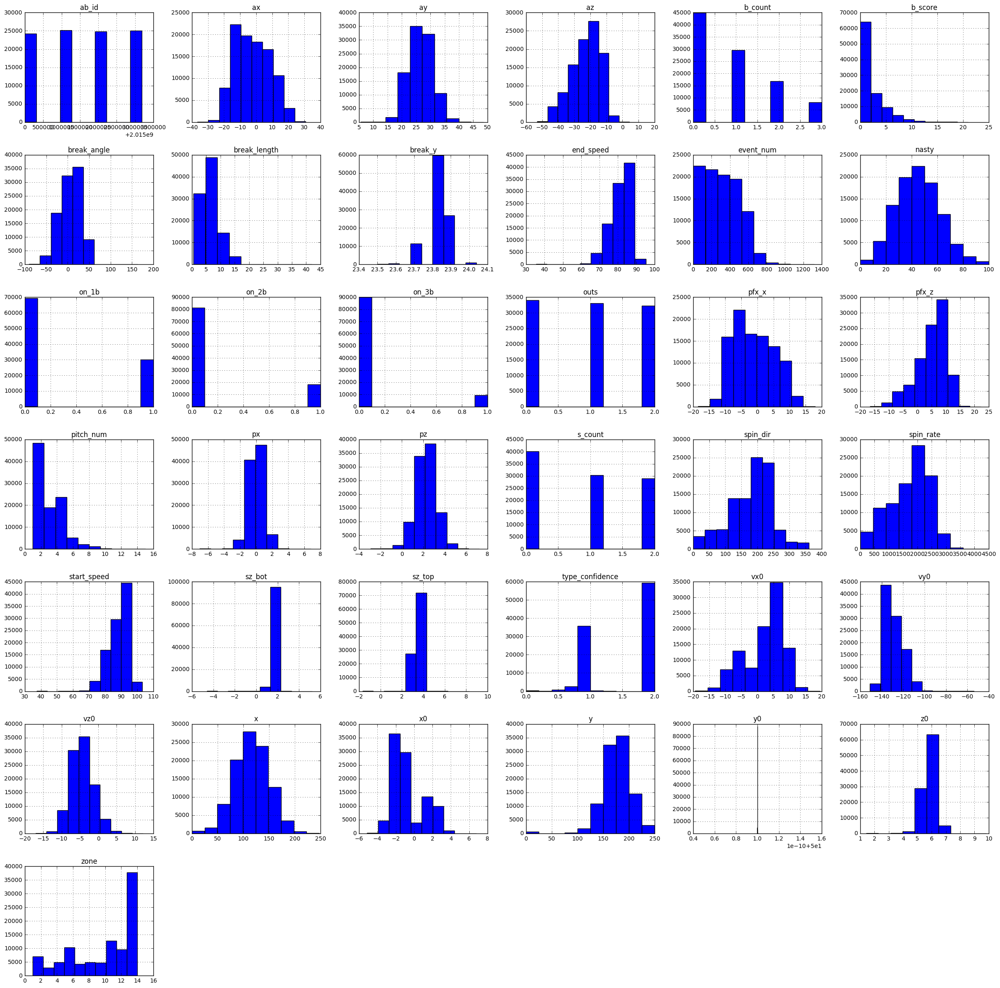

In [4]:
#Visualize by histogram
X.hist(figsize= (30,30))
plt.show()

In [9]:
#Overview of data
X_ind = X.drop([ 'sz_bot', 'sz_top', 'type_confidence', 'code', 'type', 'event_num', 'b_score', 'ab_id', 'b_count', 's_count',
 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b','zone'], axis = 1)
X_ind.describe()

,px,pz,start_speed,end_speed,spin_rate,spin_dir,break_angle,break_length,break_y,ax,...,vy0,vz0,x,x0,y,y0,z0,pfx_x,pfx_z,nasty
count,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,...,99297.000000,99297.000000,99297.000000,99297.000000,99297.000000,9.929700e+04,99297.000000,99297.000000,99297.000000,99297.000000
mean,0.006476,2.253498,88.380489,81.358742,1732.351334,180.243577,5.873200,6.525924,23.816786,-2.313447,...,-128.853112,-4.424470,116.295032,-0.713648,176.357105,5.000000e+01,5.814403,-1.142231,5.046141,44.381331
std,0.893266,0.947022,6.003900,5.352743,684.927602,67.406328,24.478651,2.867992,0.064252,10.770351,...,8.707626,3.074121,33.695992,1.732244,28.327992,3.126156e-14,0.459650,6.293688,5.183452,16.808295
min,-6.863668,-3.446873,40.800000,39.300000,8.250000,-0.002000,-89.600000,0.600000,23.400000,-45.256843,...,-152.750448,-17.700223,0.000000,-6.358000,0.000000,5.000000e+01,0.313690,-24.257847,-15.963475,0.000000
25%,-0.591445,1.644796,84.300000,77.900000,1234.110000,137.141000,-11.900000,4.300000,23.800000,-11.311000,...,-135.509116,-6.530000,93.630000,-1.953000,160.860000,5.000000e+01,5.566794,-6.480000,2.162490,32.000000
50%,0.013332,2.257483,89.700000,82.500000,1865.900000,195.827000,6.800000,6.000000,23.800000,-3.112000,...,-130.800722,-4.594613,116.240000,-1.335590,177.360000,5.000000e+01,5.844000,-1.860333,6.060000,44.000000
75%,0.609000,2.860611,93.000000,85.400000,2252.700000,225.414000,27.100000,8.000000,23.900000,5.983000,...,-122.935262,-2.489000,139.340000,0.789000,193.810000,5.000000e+01,6.105000,3.870000,8.949395,56.000000
max,6.616000,11.613109,105.000000,95.300000,4999.069000,359.973000,268.100000,37.500000,24.200000,40.181000,...,-59.085000,12.990721,248.810000,5.451000,249.980000,5.000000e+01,9.498000,20.920000,23.560012,100.000000


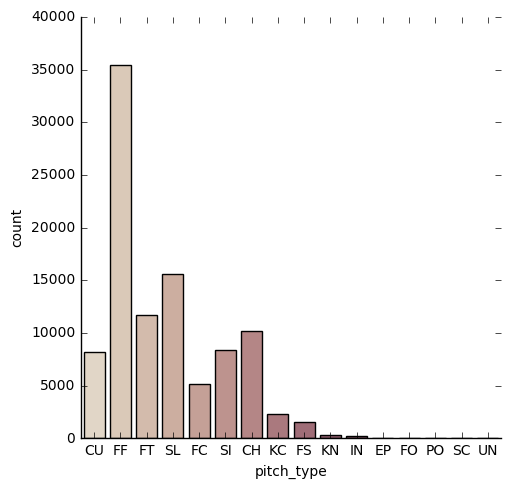

In [3]:
#Visualize pitch type
sns.catplot(x="pitch_type", kind="count", palette="ch:.25", data=X);
plt.show()

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


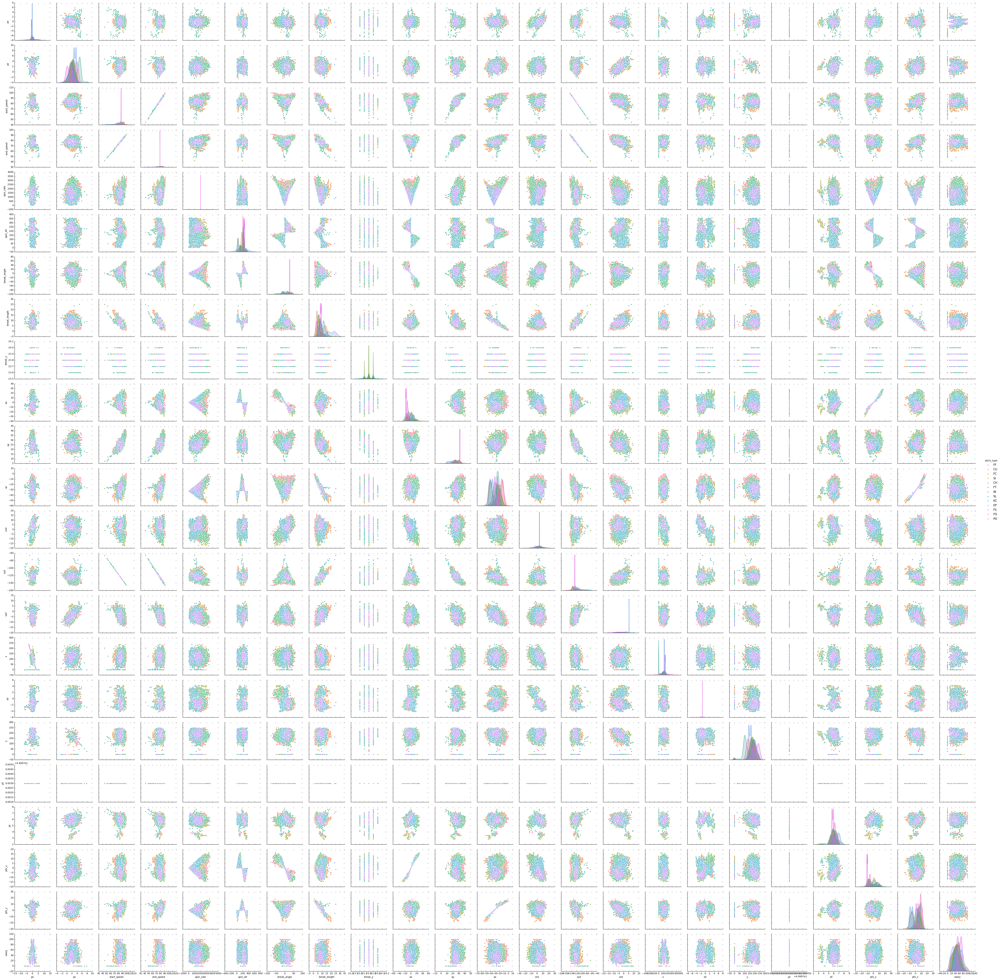

425.9053604602814


In [35]:
#Visualize by scatter plot

start = time.time() 

#drop irrelevent features
X_ind = X.drop([ 'sz_bot', 'sz_top', 'type_confidence', 'code', 'type', 'event_num', 'b_score', 'ab_id', 'b_count', 's_count',
 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b','zone'], axis = 1)

fig = sns.pairplot(X_ind, hue="pitch_type")
fig.savefig("output.png")
plt.show()

end = time.time()
print(end - start)

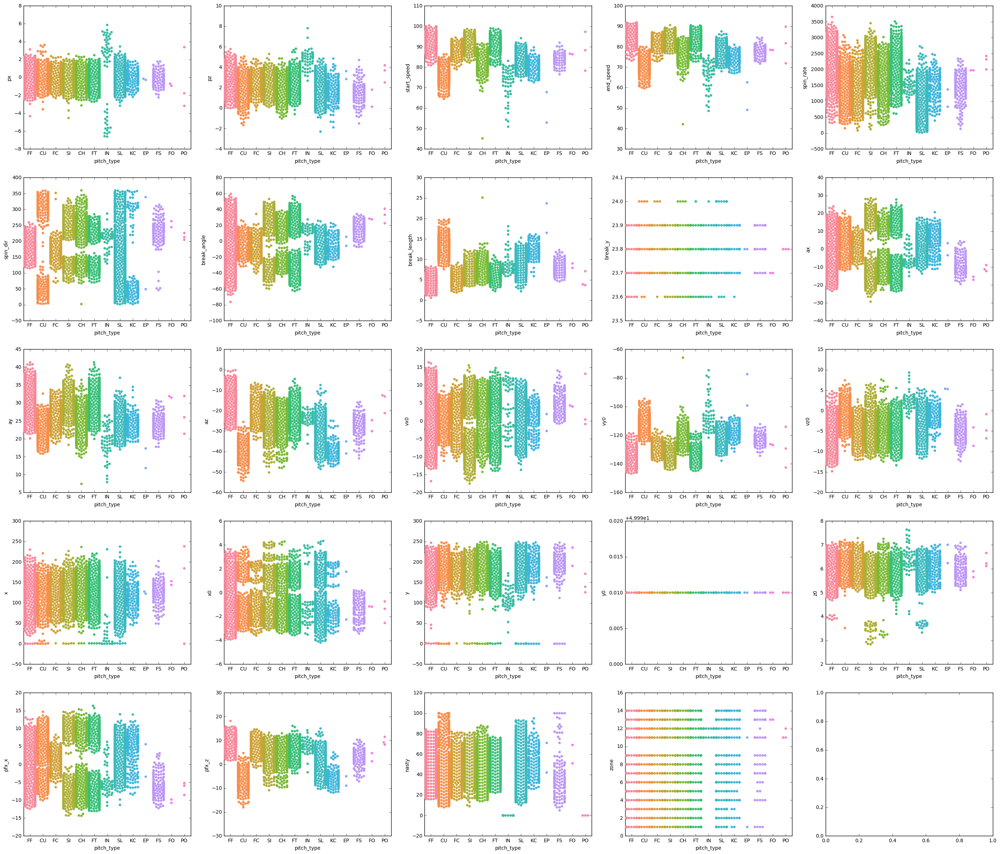

In [36]:
#Visaulize by swarm plot

#possible feature list
ob = ['px', 'pz', 'start_speed', 'end_speed', 'spin_rate', 'spin_dir', 'break_angle', 'break_length', 'break_y', 'ax', 'ay', 'az', 
 'vx0', 'vy0', 'vz0', 'x', 'x0', 'y', 'y0', 'z0', 'pfx_x', 'pfx_z', 'nasty', 'zone']

fig, ax = plt.subplots(5, 5, figsize=(35, 30))
for variable, subplot in zip(ob, ax.flatten()):
    sns.swarmplot(x="pitch_type", y=variable, data=X, ax=subplot)
plt.show()

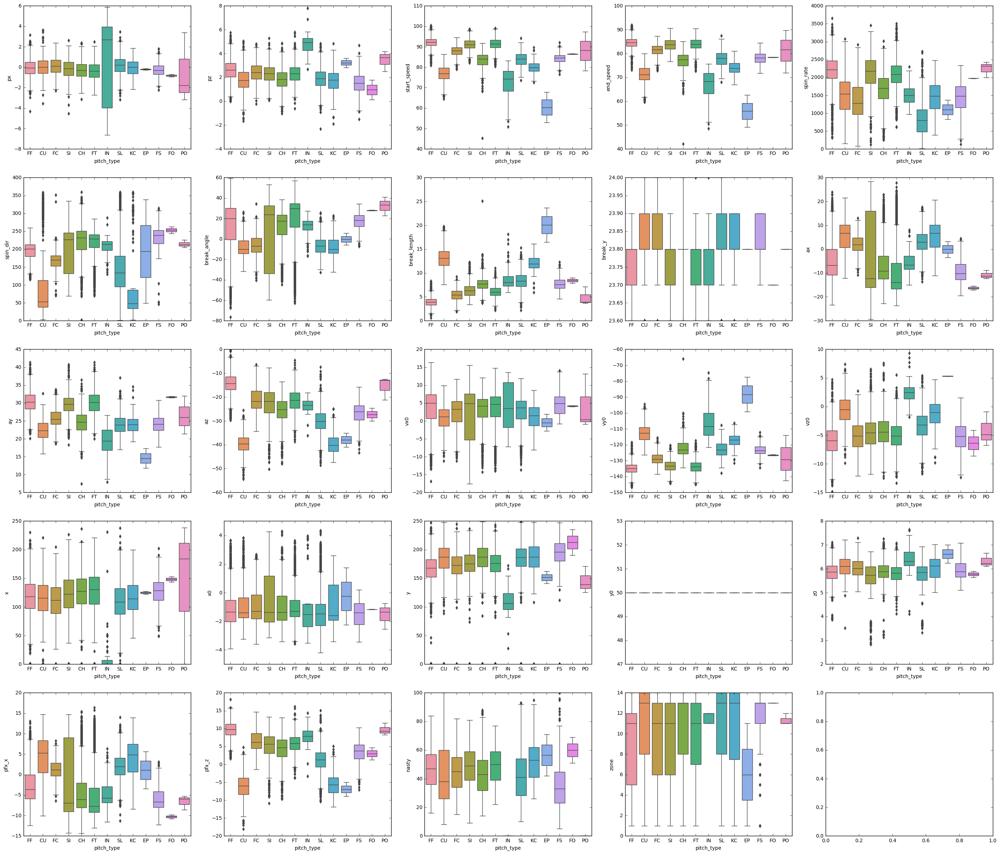

In [27]:
#Visaulize by barplot

#possible feature list
ob = ['px', 'pz', 'start_speed', 'end_speed', 'spin_rate', 'spin_dir', 'break_angle', 'break_length', 'break_y', 'ax', 'ay', 'az', 
 'vx0', 'vy0', 'vz0', 'x', 'x0', 'y', 'y0', 'z0', 'pfx_x', 'pfx_z', 'nasty', 'zone']

fig, ax = plt.subplots(5, 5, figsize=(35, 30))
for variable, subplot in zip(ob, ax.flatten()):
    sns.boxplot(x="pitch_type", y=variable, data=X, ax=subplot)
plt.show()

# Variable correlation analysis

In [5]:
#Analysis correlation between variables
# pairwise correlation
X = X.drop([ 'sz_bot', 'sz_top', 'type_confidence', 'code', 'type', 'event_num', 'b_score', 'ab_id', 'b_count', 's_count',
 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b','zone','pitch_type'], axis = 1)
X.corr(method='spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

In [6]:
#Analysis correlation between variables
# pairwise correlation
X.corr(method='kendall').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

In [7]:
#Analysis correlation between variables
# pairwise correlation
X.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

# Variance Thresholding For Feature Selection

In [91]:
X_VT = X.drop([ 'sz_bot', 'sz_top', 'type_confidence', 'code', 'type', 'event_num', 'b_score', 'ab_id', 'b_count', 's_count',
 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b','zone','pitch_type'], axis = 1)

# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_scaled = sc.fit_transform(X_VT)


# Create VarianceThreshold object with a variance with a threshold of 0.5
from sklearn.feature_selection import VarianceThreshold
thresholder = VarianceThreshold(threshold=.5)

# Conduct variance thresholding
X_high_variance = thresholder.fit_transform(X_VT)
Name = thresholder.get_support( )

#showing result
names = list(X_VT)
header = np.asarray(names)
Result = np.asarray(Name)
df = pd.DataFrame(header, columns=['Feature'])
df2 = pd.DataFrame(Result, columns=['Result'])
final = df.join(df2)
final

,Feature,Result
0,px,True
1,pz,True
2,start_speed,True
3,end_speed,True
4,spin_rate,True
5,spin_dir,True
6,break_angle,True
7,break_length,True
8,break_y,False
9,ax,True


#  Univariate Selection

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif

#load data
X_US = X.drop([ 'sz_bot', 'sz_top', 'type_confidence', 'code', 'type', 'event_num', 'b_score', 'ab_id', 'b_count', 's_count',
 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b','zone','pitch_type'], axis = 1).values
y_US = X.iloc[0:, 23].values


# feature extraction
test = SelectKBest(score_func=mutual_info_classif, k=10)
fit = test.fit(X_US, y_US)

# summarize scores
numpy.set_printoptions(precision=3)
print(fit.scores_)
#features = fit.transform(X_US)
# summarize selected features
#print(features[0:5,:])

# Dimensionality reduction

In [16]:
# Applying PCA
from sklearn.decomposition import PCA
X_pca_input = X.drop([ 'sz_bot', 'sz_top', 'type_confidence', 'code', 'type', 'event_num', 'b_score', 'ab_id', 'b_count', 's_count',
 'outs', 'pitch_num', 'on_1b', 'on_2b', 'on_3b','zone','pitch_type'], axis = 1)

pca = PCA(n_components = 10)
X_pca = pca.fit_transform(X_pca_input)
explained_variance = pca.explained_variance_ratio_
components = pca.components_

#print (components, explained_variance)

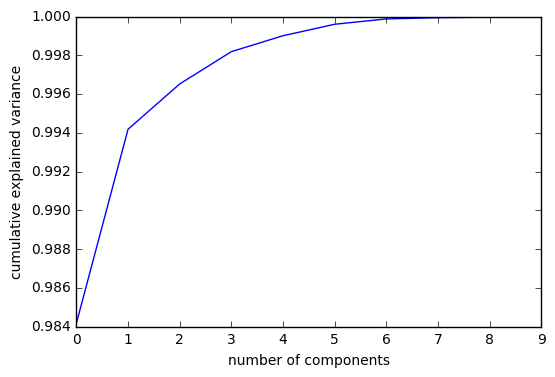

In [17]:
#Visualize pca cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [ ]:
#Applying t-SNE

import time
start = time.time() 

from sklearn import manifold
tsne = manifold.TSNE(n_components = 3, init = 'pca')
X_tsne = tsne.fit_transform(X_pca_input)

#execution time estimation
end = time.time()
print(end - start)